In [1]:
from data_loader import bench, deadlift, squat, workouts, result_df # generates array of workout data
import numpy as np
from scipy.fft import fft, fftfreq
import pandas as pd 
import plotly
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import matplotlib.pyplot as plt

class Workout:
    bench = "bench"
    squat = "squat"
    deadlift = "deadlift"
    workouts = [bench, squat, deadlift]
    def __init__(self):
        self.data = {}
        for workout in Workout.workouts:
            self.data[workout] = {}

    def __contains__(self, item):
        return self.data[item]

# Example Usage:
# myWorkout = Workout()
# myWorkout.data[Workout.bench]
#workout.data[bench/deadlift/squat][feature][set#]
#workout_data = Workout()

    

neal deadlift 0
brian deadlift 0
brian bench 0
tejas bench 0
novel bench 0
neal bench 0
brian bench 1
brian bench 2
tejas bench 1
novel bench 1
novel bench 2
brian bench 3
tejas bench 2
brian bench 4
tejas bench 3
neal bench 1
brian bench 5
novel bench 3
brian bench 6
brian squat 0
novel squat 0
brian squat 1
brian squat 2
tejas squat 0
novel squat 1
brian squat 3
novel squat 2
novel squat 3
neal squat 0
brian squat 4
                           relativeAltitude  seconds_elapsed    pressure  \
name  workout  set_number                                                  
brian bench    0                       0.00         7.011909  100.453018   
               0                       0.00         7.867835  100.453293   
               0                      -0.03        10.968242  100.454849   
               0                      -0.04        46.088523  100.455017   
               0                        NaN              NaN         NaN   
...                                     ...   

In [2]:
result_df

relativeAltitude  seconds_elapsed    pressure  \
name  workout  set_number                                                  
brian bench    0                       0.00         7.011909  100.453018   
               0                       0.00         7.867835  100.453293   
               0                      -0.03        10.968242  100.454849   
               0                      -0.04        46.088523  100.455017   
               0                        NaN              NaN         NaN   
...                                     ...              ...         ...   
neal  deadlift 0                        NaN        40.367102         NaN   
               0                        NaN        40.377064         NaN   
               0                        NaN        40.387027         NaN   
               0                        NaN        40.396989         NaN   
               0                        NaN        40.406951         NaN   

                                   sensor          time  \
name  workout  set_number                                 
brian bench    0           WatchBarometer  1.726273e+18   
               0           WatchBarometer  1.726273e+18   
               0           WatchBarometer  1.726273e+18   
               0           WatchBarometer  1.726273e+18   
               0                 Metadata           NaN   
...                                   ...           ...   
neal  deadlift 0              WristMotion  1.726275e+18   
               0              WristMotion  1.726275e+18   
               0              WristMotion  1.726275e+18   
               0              WristMotion  1.726275e+18   
               0              WristMotion  1.726275e+18   

                                                      device id  version  \
name  workout  set_number                                                  
brian bench    0                                            NaN      NaN   
               0                                            NaN      NaN   
               0                                            NaN      NaN   
               0                                            NaN      NaN   
               0           250fad1f-c20d-4511-bbbd-b39f8226ca7f      3.0   
...                                                         ...      ...   
neal  deadlift 0                                            NaN      NaN   
               0                                            NaN      NaN   
               0                                            NaN      NaN   
               0                                            NaN      NaN   
               0                                            NaN      NaN   

                             device name sampleRateMs  recording epoch time  \
name  workout  set_number                                                     
brian bench    0                     NaN          NaN                   NaN   
               0                     NaN          NaN                   NaN   
               0                     NaN          NaN                   NaN   
               0                     NaN          NaN                   NaN   
               0           iPhone 15 Pro       10|10|          1.726273e+12   
...                                  ...          ...                   ...   
neal  deadlift 0                     NaN          NaN                   NaN   
               0                     NaN          NaN                   NaN   
               0                     NaN          NaN                   NaN   
               0                     NaN          NaN                   NaN   
               0                     NaN          NaN                   NaN   

                           ...  gravityX rotationRateY rotationRateZ  \
name  workout  set_number  ...                                         
brian bench    0           ...       NaN           NaN           NaN   
               0           ...       

In [4]:
result_df.loc[('brian', 'bench', slice(None))]
grouped = result_df.groupby(['name', 'workout', 'set_number'])

# Create a dictionary to store DataFrames for each set_number
set_dfs = {idx: df for idx, df in grouped}

# Access individual DataFrames by specifying the tuple (name, workout, set_number)
# For example, to get the DataFrame for ('brian', 'bench', 0)
brian_bench_0_df = set_dfs[('brian', 'bench', 0)]

# Display the dictionary keys to check the available (name, workout, set_number) tuples
print(set_dfs.keys())


dict_keys([('brian', 'bench', 0), ('brian', 'bench', 1), ('brian', 'bench', 2), ('brian', 'bench', 3), ('brian', 'bench', 4), ('brian', 'bench', 5), ('brian', 'bench', 6), ('brian', 'deadlift', 0), ('brian', 'squat', 0), ('brian', 'squat', 1), ('brian', 'squat', 2), ('brian', 'squat', 3), ('brian', 'squat', 4), ('neal', 'bench', 0), ('neal', 'bench', 1), ('neal', 'deadlift', 0), ('neal', 'squat', 0), ('novel', 'bench', 0), ('novel', 'bench', 1), ('novel', 'bench', 2), ('novel', 'bench', 3), ('novel', 'squat', 0), ('novel', 'squat', 1), ('novel', 'squat', 2), ('novel', 'squat', 3), ('tejas', 'bench', 0), ('tejas', 'bench', 1), ('tejas', 'bench', 2), ('tejas', 'bench', 3), ('tejas', 'squat', 0)])


In [21]:
# Group by 'set_number' to separate each set into its own DataFrame
#sets = {set_num: df for set_num, df in bench_data.groupby(level='set_number')}
#sets
brian_bench_sets = result_df.loc[idx['brian', 'bench', :], :]


In [22]:
idx = pd.IndexSlice

brian_bench_sets = result_df.loc[idx['brian', 'bench', :], :]
unique_sets = result_df.index.get_level_values('set_number').unique()

# Create a dictionary to store DataFrames for each set
set_dfs = {set_num: result_df.xs(set_num, level='set_number') for set_num in unique_sets}
brian_bench_sets

relativeAltitude  seconds_elapsed    pressure  \
name  workout set_number                                                  
brian bench   0                       0.00         7.011909  100.453018   
              0                       0.00         7.867835  100.453293   
              0                      -0.03        10.968242  100.454849   
              0                      -0.04        46.088523  100.455017   
              0                        NaN              NaN         NaN   
...                                    ...              ...         ...   
              6                        NaN        78.864019         NaN   
              6                        NaN        78.873981         NaN   
              6                        NaN        78.883943         NaN   
              6                        NaN        78.893906         NaN   
              6                        NaN        78.903868         NaN   

                                  sensor          time  \
name  workout set_number                                 
brian bench   0           WatchBarometer  1.726273e+18   
              0           WatchBarometer  1.726273e+18   
              0           WatchBarometer  1.726273e+18   
              0           WatchBarometer  1.726273e+18   
              0                 Metadata           NaN   
...                                  ...           ...   
              6              WristMotion  1.726273e+18   
              6              WristMotion  1.726273e+18   
              6              WristMotion  1.726273e+18   
              6              WristMotion  1.726273e+18   
              6              WristMotion  1.726273e+18   

                                                     device id  version  \
name  workout set_number                                                  
brian bench   0                                            NaN      NaN   
              0                                            NaN      NaN   
              0                                            NaN      NaN   
              0                                            NaN      NaN   
              0           250fad1f-c20d-4511-bbbd-b39f8226ca7f      3.0   
...                                                        ...      ...   
              6                                            NaN      NaN   
              6                                            NaN      NaN   
              6                                            NaN      NaN   
              6                                            NaN      NaN   
              6                                            NaN      NaN   

                            device name sampleRateMs  recording epoch time  \
name  workout set_number                                                     
brian bench   0                     NaN          NaN                   NaN   
              0                     NaN          NaN                   NaN   
              0                     NaN          NaN                   NaN   
              0                     NaN          NaN                   NaN   
              0           iPhone 15 Pro       10|10|          1.726273e+12   
...                                 ...          ...                   ...   
              6                     NaN          NaN                   NaN   
              6                     NaN          NaN                   NaN   
              6                     NaN          NaN                   NaN   
              6                     NaN          NaN                   NaN   
              6                     NaN          NaN                   NaN   

                          ...  gravityX rotationRateY rotationRateZ  gravityY  \
name  workout set_number  ...                                                   
brian bench   0           ...       NaN           NaN           NaN       NaN   
              0           ...       NaN           NaN        

In [23]:
unique_set_numbers = brian_bench_sets.index.get_level_values('set_number').unique()

# Dictionary to store each set as a separate DataFrame
set_dfs = {set_num: brian_bench_sets.xs(set_num, level='set_number') for set_num in unique_set_numbers}


In [26]:
set_dfs[3]

relativeAltitude  seconds_elapsed    pressure          sensor  \
name  workout                                                                  
brian bench           -0.010000         4.342781  100.878059  WatchBarometer   
      bench           -0.120001         6.920105  100.877701  WatchBarometer   
      bench           -0.250000         9.487282  100.878212  WatchBarometer   
      bench           -0.270000        12.009199  100.879074  WatchBarometer   
      bench           -0.270000        14.570529  100.878830  WatchBarometer   
...                         ...              ...         ...             ...   
      bench                 NaN        14.752839         NaN     WristMotion   
      bench                 NaN        14.762802         NaN     WristMotion   
      bench                 NaN        14.772764         NaN     WristMotion   
      bench                 NaN        14.782726         NaN     WristMotion   
      bench                 NaN        14.792689         NaN     WristMotion   

                       time device id  version device name sampleRateMs  \
name  workout                                                             
brian bench    1.727833e+18       NaN      NaN         NaN          NaN   
      bench    1.727833e+18       NaN      NaN         NaN          NaN   
      bench    1.727833e+18       NaN      NaN         NaN          NaN   
      bench    1.727833e+18       NaN      NaN         NaN          NaN   
      bench    1.727833e+18       NaN      NaN         NaN          NaN   
...                     ...       ...      ...         ...          ...   
      bench    1.727833e+18       NaN      NaN         NaN          NaN   
      bench    1.727833e+18       NaN      NaN         NaN          NaN   
      bench    1.727833e+18       NaN      NaN         NaN          NaN   
      bench    1.727833e+18       NaN      NaN         NaN          NaN   
      bench    1.727833e+18       NaN      NaN         NaN          NaN   

               recording epoch time  ...  gravityX rotationRateY  \
name  workout                        ...                           
brian bench                     NaN  ...       NaN           NaN   
      bench                     NaN  ...       NaN           NaN   
      bench                     NaN  ...       NaN           NaN   
      bench                     NaN  ...       NaN           NaN   
      bench                     NaN  ...       NaN           NaN   
...                             ...  ...       ...           ...   
      bench                     NaN  ... -0.980111     -0.929940   
      bench                     NaN  ... -0.979215     -0.900999   
      bench                     NaN  ... -0.978407     -0.794448   
      bench                     NaN  ... -0.977634     -0.775877   
      bench                     NaN  ... -0.976616     -0.748436   

              rotationRateZ  gravityY  quaternionX quaternionY  quaternionZ  \
name  workout                                                                 
brian bench             NaN       NaN          NaN         NaN          NaN   
      bench             NaN       NaN          NaN         NaN          NaN   
      bench             NaN       NaN          NaN         NaN          NaN   
      bench             NaN       NaN          NaN         NaN          NaN   
      bench             NaN       NaN          NaN         NaN          NaN   
...                     ...       ...          ...         ...          ...   
      bench       -0.226123  0.152069    -0.746300    0.082389    -0.659852   
      bench       -0.220893  0.149148    -0.749515    0.083378    -0.656181   
      bench       -0.302936  0.145845    -0.752439    0.084037    -0.652837   
      bench       -0.210469  0.142367    -0.755148    0.084559    -0.649722   
      bench       -0.103257  0.140132    -0.757717    0.085966    -0.646615   

               gravityZ  accelerationX  rotationRateX  
name  workout                

In [11]:
giant_df = pd.concat(total_data)

# Set the multi-level index
giant_df = giant_df.set_index(['name', 'exercise', 'set_number'])

# Now you can access 'sensor_data' using the hierarchical indexing
# For example, to access sensor_data for a specific name, exercise, and set number
#sensor_data = giant_df.loc[('brian', 'deadlift', 1), 'gravityX']


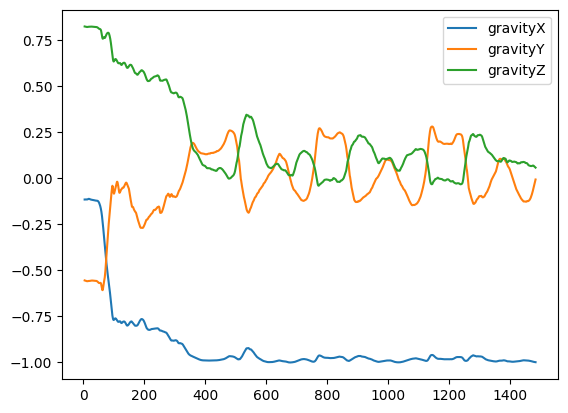

In [4]:
features = ['gravityX', 'gravityY', 'gravityZ', 'rotationRateX', 'rotationRateY', 'rotationRateZ'] #the features we chose to look at
f1 = ['gravityX', 'gravityY', 'gravityZ']
f2 = ['rotationRateX', 'rotationRateY', 'rotationRateZ']
i = 0
for f in f1:
    plt.plot(bench[3][f])

plt.legend(f1)

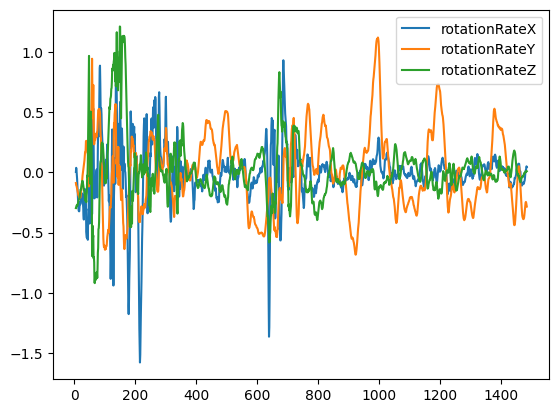

In [5]:
features = ['gravityX', 'gravityY', 'gravityZ', 'rotationRateX', 'rotationRateY', 'rotationRateZ'] #the features we chose to look at
f1 = ['gravityX', 'gravityY', 'gravityZ']
f2 = ['rotationRateX', 'rotationRateY', 'rotationRateZ']
i = 0
for f in f2:
    plt.plot(squat[3][f])

plt.legend(f2)

In [6]:
sample_size=1000 #size of the random window we are taking 
grav_x_minus_grav_y = []
grav_x_minus_grav_y_label = []

grav_x_minus_grav_z = []


for i in range(1000//14):
    for workoutSet in bench: #e is the set
        feature_data = []
        start_idx = np.random.randint(0, len(workoutSet[features[0]]) - sample_size + 1)
        for feature in features:
            feature_data.append(workoutSet[feature][start_idx:start_idx+sample_size].to_numpy())
        grav_x_minus_grav_y.append(np.nan_to_num(feature_data[0]-feature_data[1])) #you are appending the differences of the first 2 features t0 is gravityX and t1 is gravityY
        grav_x_minus_grav_y_label.append('bench')

        grav_x_minus_grav_z.append(np.nan_to_num(feature_data[0]-feature_data[2])) #you are appending the differences of the first 2 features t0 is gravityX and t1 is gravityY
        
bench_data = workout_data.data[Workout.bench]
bench_data["grav_x_minus_grav_y"] = grav_x_minus_grav_y.copy()
#grav_x_minus_grav_y.clear()

# workout_data.data[Workout.bench] = {"grav_x_minus_grav_z" : grav_x_minus_grav_z.copy()}
bench_data["grav_x_minus_grav_z"] = grav_x_minus_grav_z.copy()
grav_x_minus_grav_z.clear()
#grav_x_minus_grav_y = np.array(grav_x_minus_grav_y)

#grav_x_minus_grav_y.shape
#workout_data.data[Workout.bench]

In [7]:
sample_size=1000
#grav_x_minus_grav_y = []
#grav_x_minus_grav_y_label = []
for i in range(500): #fewest set should get most sampmles  500 * 2 ssets =~ 1000
    for workoutSet in deadlift: #e is a single set in the deadlift
        feature_data= []
        start_idx = np.random.randint(0, len(workoutSet[features[0]]) - sample_size + 1) #from 0 to (length of json packet) - 1000, pick a random index 
        for feature in features: 
            feature_data.append(workoutSet[feature][start_idx:start_idx+sample_size].to_numpy()) #e is a data frame (set), a is feature of the data frame 
        grav_x_minus_grav_y.append(np.nan_to_num(feature_data[0]-feature_data[1])) #you are appending the differences of the first 2 features
        grav_x_minus_grav_y_label.append('deadlift')

        grav_x_minus_grav_z.append(np.nan_to_num(feature_data[0]-feature_data[2]))
deadlift_data = workout_data.data[Workout.deadlift]
deadlift_data["grav_x_minus_grav_y"] = grav_x_minus_grav_y.copy()
#grav_x_minus_grav_y.clear()


deadlift_data["grav_x_minus_grav_z"] = grav_x_minus_grav_z.copy()
grav_x_minus_grav_z.clear()    
#grav_x_minus_grav_y = np.array(grav_x_minus_grav_y)

#grav_x_minus_grav_y.shape
#workout_data.data[Workout.deadlift]

In [8]:
sample_size=1000 #since have less samples, extract more data from it
#grav_x_minus_grav_y = []
#y = []
for i in range(125):
    for workoutSet in squat:
        feature_data= []
        start_idx = np.random.randint(0, len(workoutSet[features[0]]) - sample_size + 1)
        for a in features:
            feature_data.append(workoutSet[a][start_idx:start_idx+sample_size].to_numpy())
        grav_x_minus_grav_y.append(np.nan_to_num(feature_data[0]-feature_data[1])) #you are appending the differences of the first 2 features
        grav_x_minus_grav_y_label.append('squat')

        grav_x_minus_grav_z.append(np.nan_to_num(feature_data[0]-feature_data[2]))
squat_data = workout_data.data[Workout.squat]
squat_data["grav_x_minus_grav_y"] = grav_x_minus_grav_y.copy()
#grav_x_minus_grav_y.clear()

squat_data["grav_x_minus_grav_z"] = grav_x_minus_grav_z.copy()
grav_x_minus_grav_z.clear()  
#grav_x_minus_grav_y = np.array(grav_x_minus_grav_y)

#grav_x_minus_grav_y.shape
#workout_data.data[Workout.squat]


In [9]:
grav_x_minus_grav_y = np.array(grav_x_minus_grav_y)

grav_x_minus_grav_y.shape


(3369, 1000)

In [10]:
keys = list(workout_data.data[Workout.bench].keys())
len(workout_data.data[Workout.bench][keys[0]][0])
#type(workout_data.data[Workout.bench][keys[0]])

1000

In [11]:
from sklearn.model_selection import train_test_split
#grav_x_minus_grav_y = []
X_train, X_test, y_train, y_test = train_test_split(grav_x_minus_grav_y, grav_x_minus_grav_y_label, test_size=0.2, random_state=42, shuffle=True) #grav_x_minus_grav_y is training data and grav_x_minus_grav_y_label is label

In [12]:
import catboost
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

cbc = catboost.CatBoostClassifier()

cbc.fit(X_train, y_train)

y_pred = cbc.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)


Learning rate set to 0.08323
0:	learn: 1.0073086	total: 236ms	remaining: 3m 55s
1:	learn: 0.9278742	total: 336ms	remaining: 2m 47s
2:	learn: 0.8640811	total: 407ms	remaining: 2m 15s
3:	learn: 0.8055487	total: 483ms	remaining: 2m
4:	learn: 0.7587648	total: 558ms	remaining: 1m 50s
5:	learn: 0.7146469	total: 626ms	remaining: 1m 43s
6:	learn: 0.6730673	total: 691ms	remaining: 1m 38s
7:	learn: 0.6365508	total: 760ms	remaining: 1m 34s
8:	learn: 0.6016835	total: 823ms	remaining: 1m 30s
9:	learn: 0.5727736	total: 897ms	remaining: 1m 28s
10:	learn: 0.5441937	total: 969ms	remaining: 1m 27s
11:	learn: 0.5194297	total: 1.03s	remaining: 1m 25s
12:	learn: 0.4971603	total: 1.1s	remaining: 1m 23s
13:	learn: 0.4761678	total: 1.16s	remaining: 1m 21s
14:	learn: 0.4575903	total: 1.23s	remaining: 1m 20s
15:	learn: 0.4357235	total: 1.3s	remaining: 1m 20s
16:	learn: 0.4188308	total: 1.37s	remaining: 1m 19s
17:	learn: 0.4024270	total: 1.43s	remaining: 1m 18s
18:	learn: 0.3900501	total: 1.53s	remaining: 1m 19s

In [13]:
len(set(y_pred.flatten()))
# num of classes

3

In [14]:
accuracy

0.9970326409495549

In [15]:
keys = list(workout_data.data[Workout.bench].keys())
keys

['grav_x_minus_grav_y', 'grav_x_minus_grav_z']

In [16]:
len(workout_data.data[Workout.bench][keys[0]][0])


1000

In [17]:
type(workout_data.data[Workout.bench][keys[0]])

list

In [18]:
bench_gx_gy_diff = workout_data.data[Workout.bench][keys[0]]
#bench_gx_gy_diff

In [19]:
len(bench_gx_gy_diff)

994

In [20]:
bench_gx_gy_diff_tensor = np.array(bench_gx_gy_diff)
bench_gx_gy_diff_tensor.shape

(994, 1000)

In [21]:
n_rows, n_cols = 3, 2

In [22]:
bench_gx_gy_diff_tensor[np.random.randint(0, len(bench_gx_gy_diff), size=n_rows*n_cols)].shape

(6, 1000)

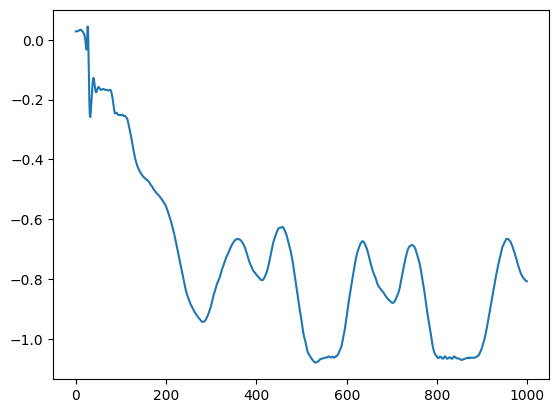

In [23]:
plt.plot(bench_gx_gy_diff_tensor[1])

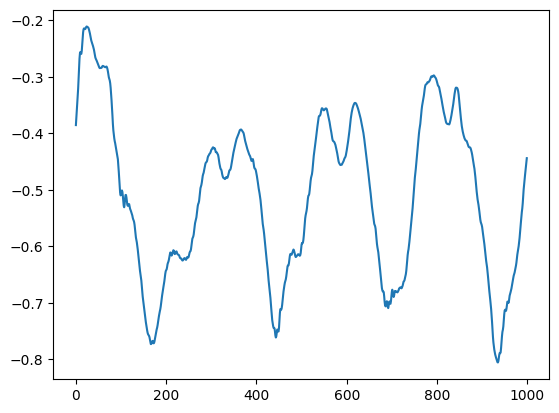

In [24]:
plt.plot(bench_gx_gy_diff_tensor[5])

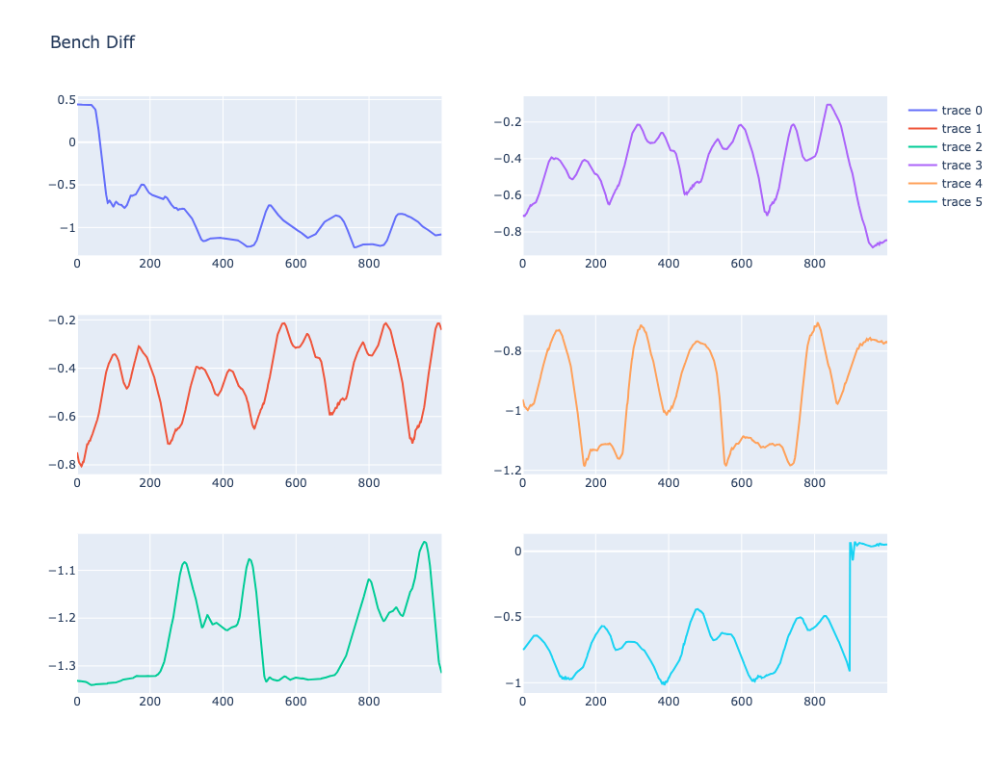

array([-0.85404111, -0.45124862, -1.2444412 , -0.44537965, -0.93897884,
       -0.65580523])

In [25]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

bench_gx_gy_diff = workout_data.data[Workout.bench][keys[0]]
bench_gx_gy_diff_tensor = np.array(bench_gx_gy_diff)
n_rows, n_cols = 3, 2
random_bench_gx_gy_diff_tensor_sample = bench_gx_gy_diff_tensor[np.random.randint(0, len(bench_gx_gy_diff), size=n_rows*n_cols)]

fig = make_subplots(rows=n_rows, cols=n_cols)

for i in range(n_rows*n_cols):
    fig.add_trace(go.Scatter(x = list(range(len(random_bench_gx_gy_diff_tensor_sample[i]))), y=random_bench_gx_gy_diff_tensor_sample[i]),
                  row=i%n_rows+1,
                  col=i//n_rows + 1
                 )

fig.update_layout(height=800, width=800, title_text="Bench Diff")
fig.show()


avgs = np.mean(random_bench_gx_gy_diff_tensor_sample, axis=1)
avgs

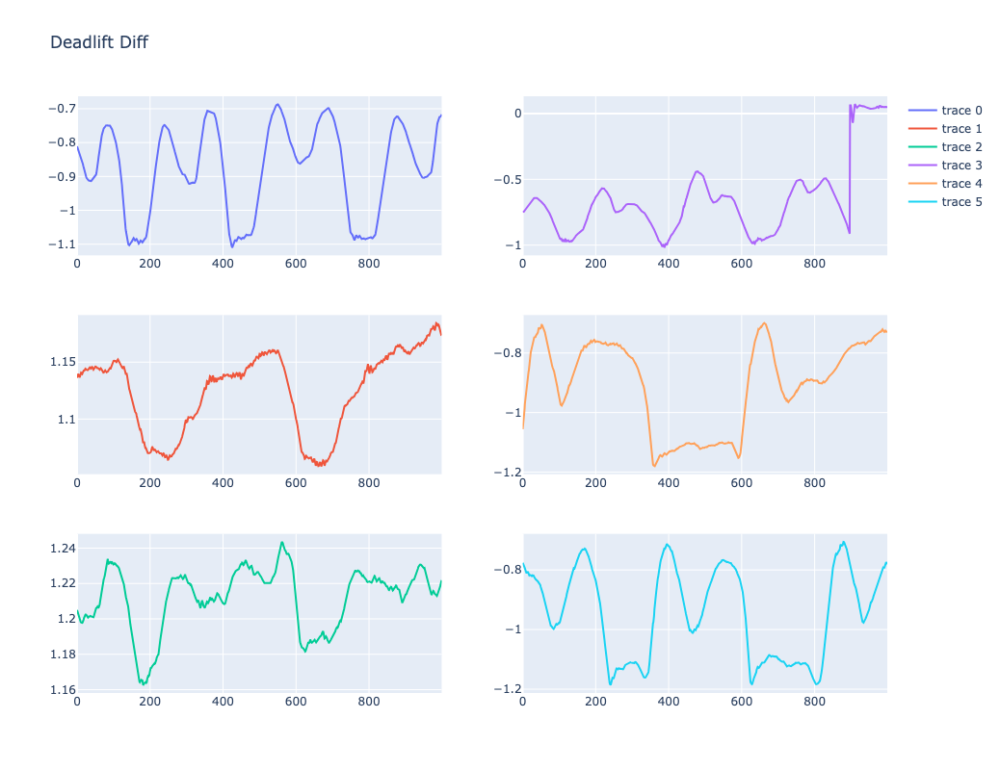

array([-0.87818146,  1.12480664,  1.21181004, -0.65580523, -0.90364425,
       -0.94451218])

In [26]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

bench_gx_gy_diff = workout_data.data[Workout.deadlift][keys[0]]
bench_gx_gy_diff_tensor = np.array(bench_gx_gy_diff)
n_rows, n_cols = 3, 2
random_bench_gx_gy_diff_tensor_sample = bench_gx_gy_diff_tensor[np.random.randint(0, len(bench_gx_gy_diff), size=n_rows*n_cols)]

fig = make_subplots(rows=n_rows, cols=n_cols)

for i in range(n_rows*n_cols):
    fig.add_trace(go.Scatter(x = list(range(len(random_bench_gx_gy_diff_tensor_sample[i]))), y=random_bench_gx_gy_diff_tensor_sample[i]),
                  row=i%n_rows+1,
                  col=i//n_rows + 1
                 )

fig.update_layout(height=800, width=800, title_text="Deadlift Diff")
fig.show()



avgs = np.mean(random_bench_gx_gy_diff_tensor_sample, axis=1)
avgs

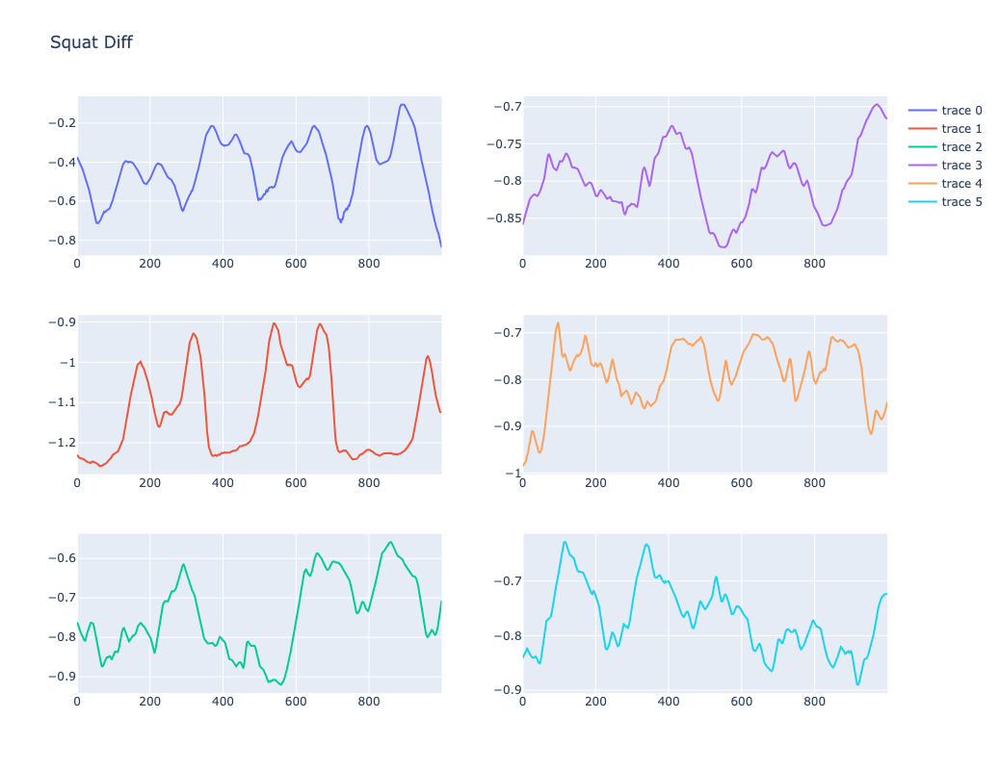

array([-0.42692141, -1.12732107, -0.74518893, -0.79886805, -0.78643031,
       -0.76865859])

In [27]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

bench_gx_gy_diff = workout_data.data[Workout.squat][keys[0]]
bench_gx_gy_diff_tensor = np.array(bench_gx_gy_diff)
n_rows, n_cols = 3, 2
random_bench_gx_gy_diff_tensor_sample = bench_gx_gy_diff_tensor[np.random.randint(0, len(bench_gx_gy_diff), size=n_rows*n_cols)]

fig = make_subplots(rows=n_rows, cols=n_cols)

for i in range(n_rows*n_cols):
    fig.add_trace(go.Scatter(x = list(range(len(random_bench_gx_gy_diff_tensor_sample[i]))), y=random_bench_gx_gy_diff_tensor_sample[i]),
                  row=i%n_rows+1,
                  col=i//n_rows + 1
                 )

fig.update_layout(height=800, width=800, title_text="Squat Diff")
fig.show()

avgs = np.mean(random_bench_gx_gy_diff_tensor_sample, axis=1)
avgs

In [28]:
type(mlp_classifier.coefs_[0])

NameError: name 'mlp_classifier' is not defined

In [ ]:
mlp_classifier.coefs_[0].shape

In [29]:
X_train[0].shape

(1000,)

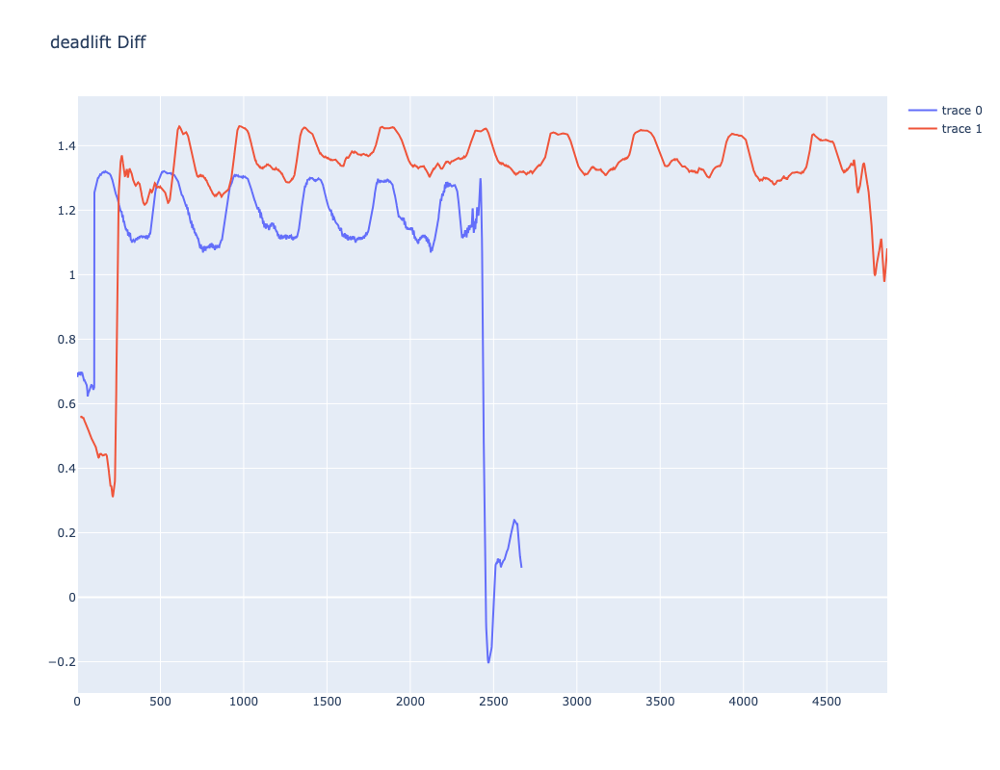

In [30]:
#n_rows, n_cols = 1, 2
#random_bench_gx_gy_diff_tensor_sample = bench_gx_gy_diff_tensor[np.random.randint(0, len(bench_gx_gy_diff), size=n_rows*n_cols)]

#fig = make_subplots(rows=n_rows, cols=n_cols)
fig = go.Figure()

for i in range(len(deadlift)):
    t = np.array(deadlift[i]['gravityX'] - deadlift[i]['gravityY']) * np.array(deadlift[i]['gravityX'] - deadlift[i]['gravityZ'])
    fig.add_trace(go.Scatter(x = list(range(len(t))), y=t),)

fig.update_layout(height=800, width=800, title_text="deadlift Diff")
fig.show()



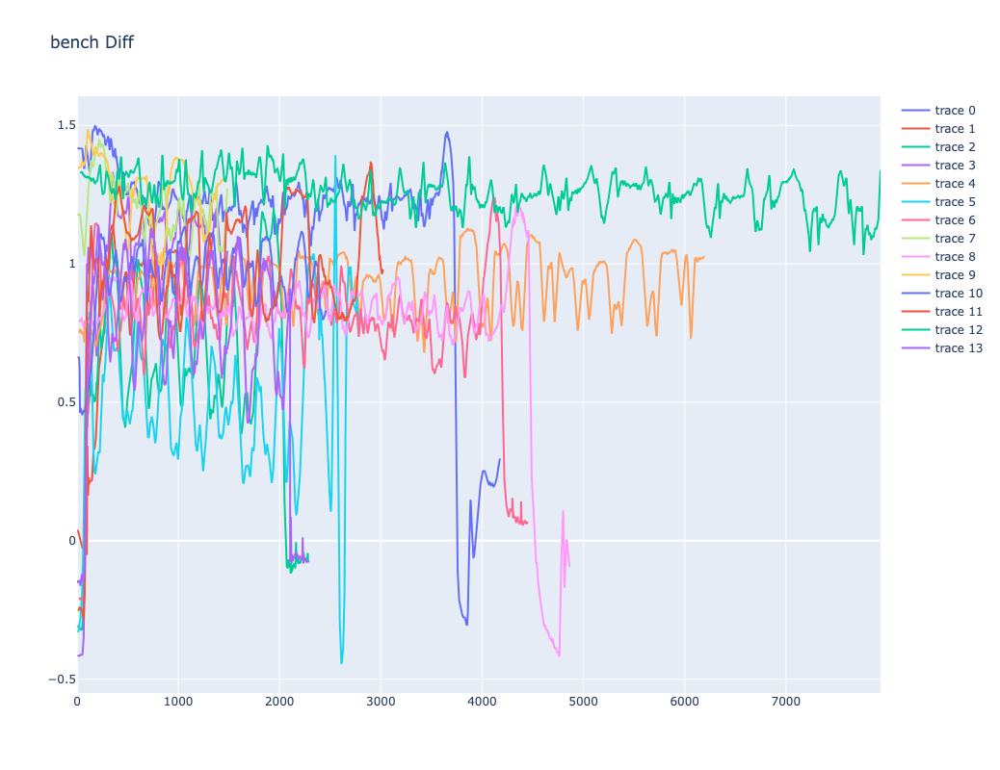

In [31]:
#n_rows, n_cols = 1, 2
#random_bench_gx_gy_diff_tensor_sample = bench_gx_gy_diff_tensor[np.random.randint(0, len(bench_gx_gy_diff), size=n_rows*n_cols)]

#fig = make_subplots(rows=n_rows, cols=n_cols)
fig = go.Figure()

for i in range(len(bench)):
    t = np.array(bench[i]['gravityX'] - bench[i]['gravityY']) * np.array(bench[i]['gravityX'] - bench[i]['gravityZ'])
    fig.add_trace(go.Scatter(x = list(range(len(t))), y=t),)

fig.update_layout(height=800, width=800, title_text="bench Diff")
fig.show()



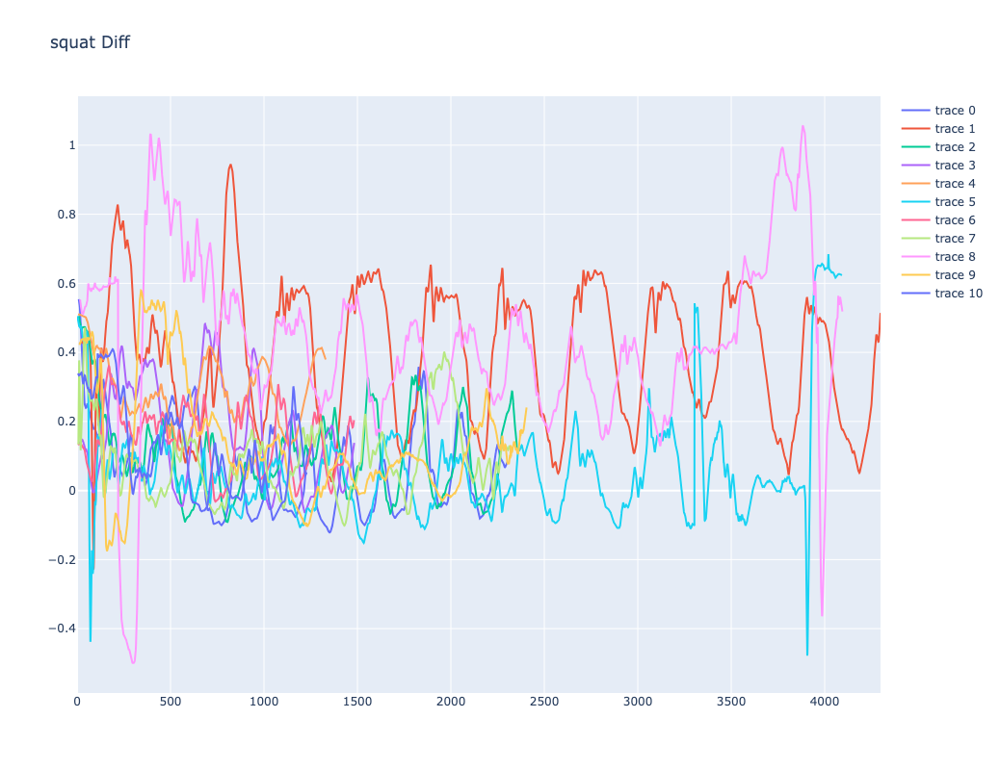

In [32]:
#n_rows, n_cols = 1, 2
#random_bench_gx_gy_diff_tensor_sample = bench_gx_gy_diff_tensor[np.random.randint(0, len(bench_gx_gy_diff), size=n_rows*n_cols)]

#fig = make_subplots(rows=n_rows, cols=n_cols)
fig = go.Figure()

for i in range(len(squat)):
    t = np.array(squat[i]['gravityX'] - squat[i]['gravityY'])*np.array(squat[i]['gravityX'] - squat[i]['gravityZ'])
    fig.add_trace(go.Scatter(x = list(range(len(t))), y=t),)

fig.update_layout(height=800, width=800, title_text="squat Diff")
fig.show()



In [35]:
feature_importances = cbc.get_feature_importance()


In [47]:
np.where(feature_importances > 0.1)

(array([  0,   1,   3,   6,   7,   9,  10,  12,  17,  20,  22,  25,  26,
         29,  30,  31,  34,  35,  38,  39,  41,  56,  59,  62,  64,  67,
         68,  71,  72,  82,  87,  88,  89,  90,  93,  94,  96,  98, 114,
        120, 121, 122, 124, 126, 128, 145, 146, 159, 162, 163, 168, 170,
        174, 176, 180, 181, 183, 184, 187, 192, 198, 200, 202, 205, 209,
        210, 212, 219, 220, 224, 230, 233, 234, 236, 239, 242, 244, 245,
        247, 248, 258, 266, 267, 275, 276, 281, 282, 283, 288, 292, 295,
        296, 297, 298, 299, 300, 308, 309, 313, 314, 319, 327, 329, 336,
        338, 343, 348, 349, 354, 356, 358, 366, 369, 377, 383, 384, 386,
        388, 389, 391, 393, 396, 397, 400, 403, 404, 405, 406, 407, 411,
        412, 414, 417, 422, 437, 438, 442, 443, 449, 451, 458, 459, 460,
        463, 466, 467, 468, 472, 476, 481, 490, 497, 501, 504, 505, 506,
        509, 515, 516, 517, 519, 520, 524, 527, 529, 530, 532, 533, 538,
        539, 542, 547, 549, 558, 563, 566, 567, 570